# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [ ]:
!pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Download the folder with the datasets and the models

In [ ]:
import gdown
url = 'https://drive.google.com/uc?id=1lBhadm971LhhbAjfUczTSfKG-5XgjbmB&export=download' 
output = 'folder.zip'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1lBhadm971LhhbAjfUczTSfKG-5XgjbmB&export=download
To: /content/folder.zip
100%|██████████| 408M/408M [00:01<00:00, 288MB/s]


'folder.zip'

In [ ]:
!unzip folder.zip

Archive:  folder.zip
   creating: datasets/
   creating: datasets/coco128/
  inflating: datasets/coco128/.DS_Store  
   creating: datasets/coco128/images/
  inflating: datasets/coco128/images/.DS_Store  
   creating: datasets/coco128/images/train2017/
  inflating: datasets/coco128/images/train2017/.DS_Store  
  inflating: datasets/coco128/images/train2017/000000000009.jpg  
  inflating: datasets/coco128/images/train2017/000000000025.jpg  
  inflating: datasets/coco128/images/train2017/000000000030.jpg  
  inflating: datasets/coco128/images/train2017/000000000034.jpg  
  inflating: datasets/coco128/images/train2017/000000000036.jpg  
  inflating: datasets/coco128/images/train2017/000000000042.jpg  
  inflating: datasets/coco128/images/train2017/000000000049.jpg  
  inflating: datasets/coco128/images/train2017/000000000061.jpg  
  inflating: datasets/coco128/images/train2017/000000000064.jpg  
  inflating: datasets/coco128/images/train2017/000000000071.jpg  
  inflating: datasets/coco128

In [ ]:
%cd yolov5
%pip install -qr requirements.txt # install dependencies
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

/content/yolov5
     |████████████████████████████████| 596 kB 14.5 MB/s 
Setup complete. Using torch 1.12.0+cu113 (Tesla T4)


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 640 --batch 16 --epochs 300 --data data/hands.yaml --weights yolov5l.pt --cache

train: weights=yolov5l.pt, cfg=, data=data/hands.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 103, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 103 (delta 63), reused 89 (delta 58), pack-reused 6
Receiving objects: 100% (103/103), 46.52 KiB | 23.26 MiB/s, done.
Resolving deltas: 100% (63/63), completed with 5 local objects.
From https://github.com/ultralytics/yolov5
   92e47b8..4c1784b  master     -> 

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source data/images/handstest/

detect: weights=['runs/train/exp/weights/best.pt'], source=data/images/handstest/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/30 /content/yolov5/data/images/handstest/01.jpg: 384x640 2 Handss, Done. (0.035s)
image 2/30 /content/yolov5/data/images/handstest/02.jpg: 384x640 2 Handss, Done. (0.035s)
image 3/30 /content/yolov5/data/images/handstest/03.jpg: 384x640 2 Handss, Done. (0.030s)
image 4/30 /content/yolov5/data/images/handstest/04.jpg: 384x640 2 Handss, Done. (0.02

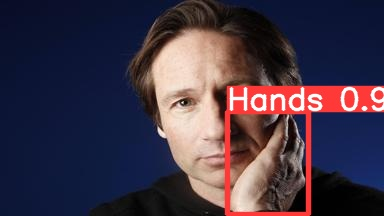

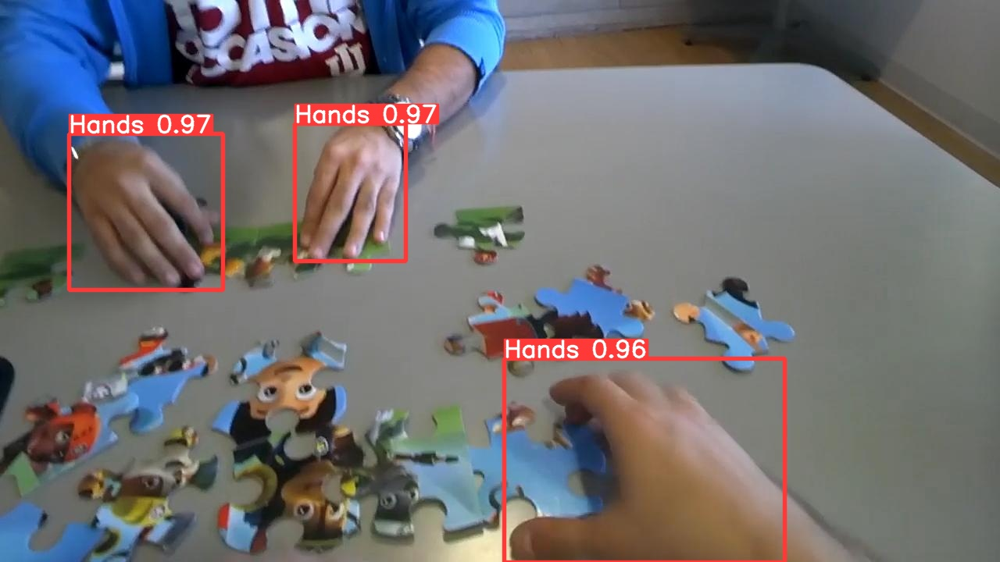

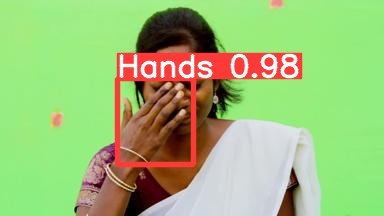

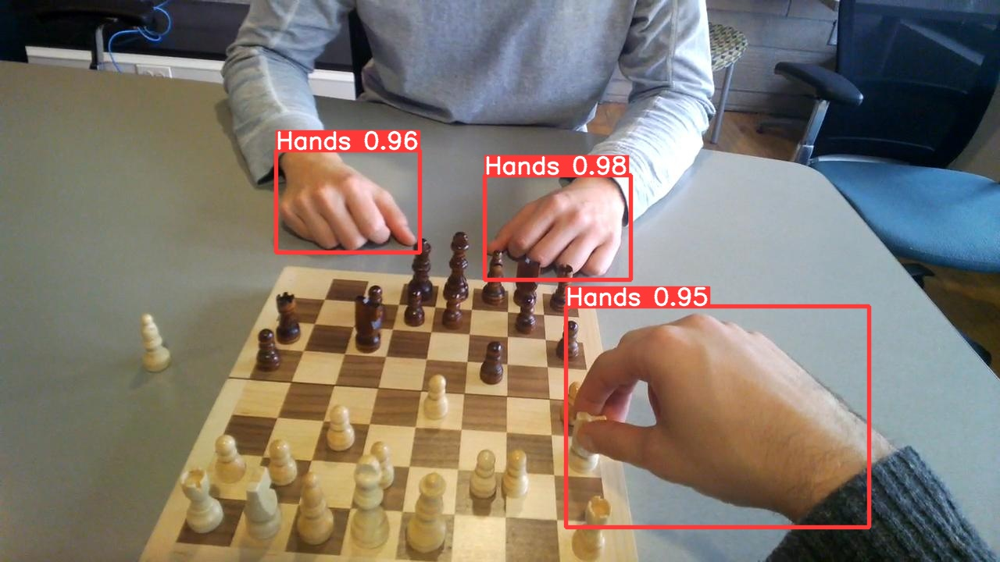

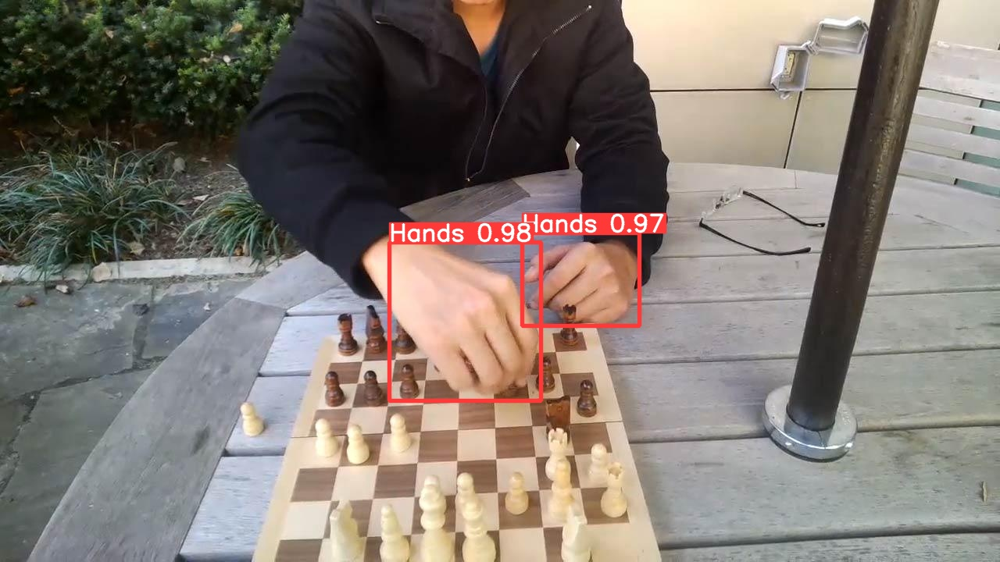

...

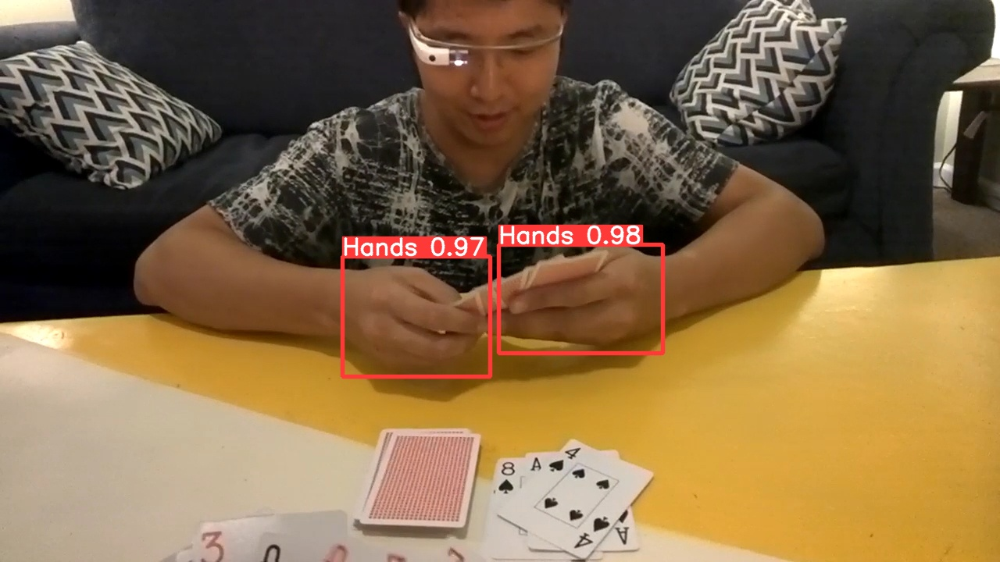

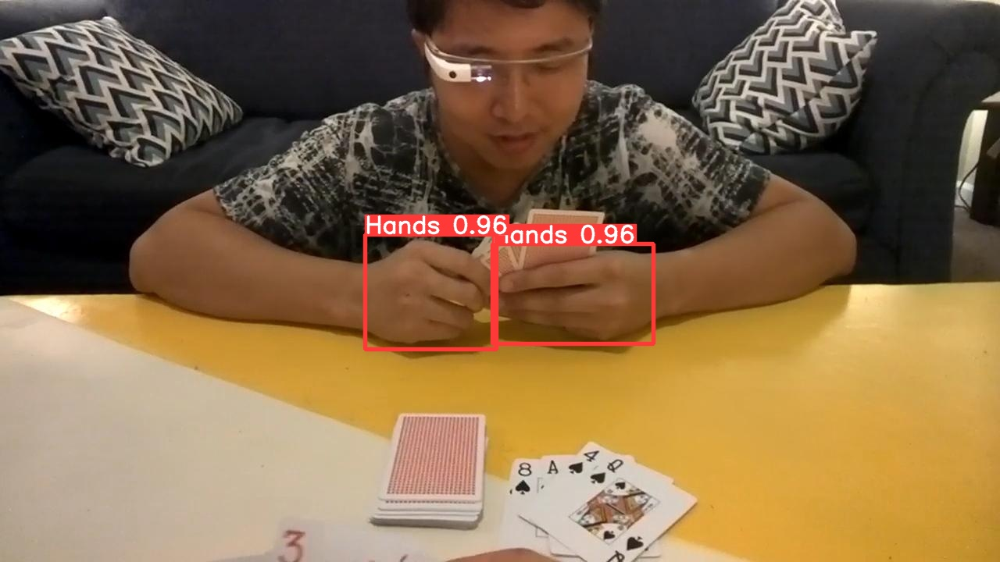

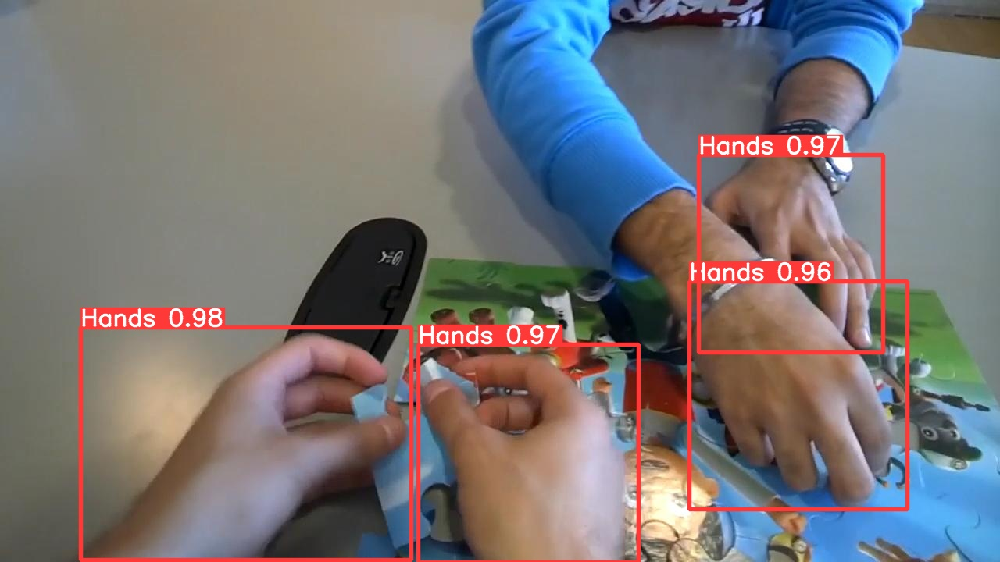

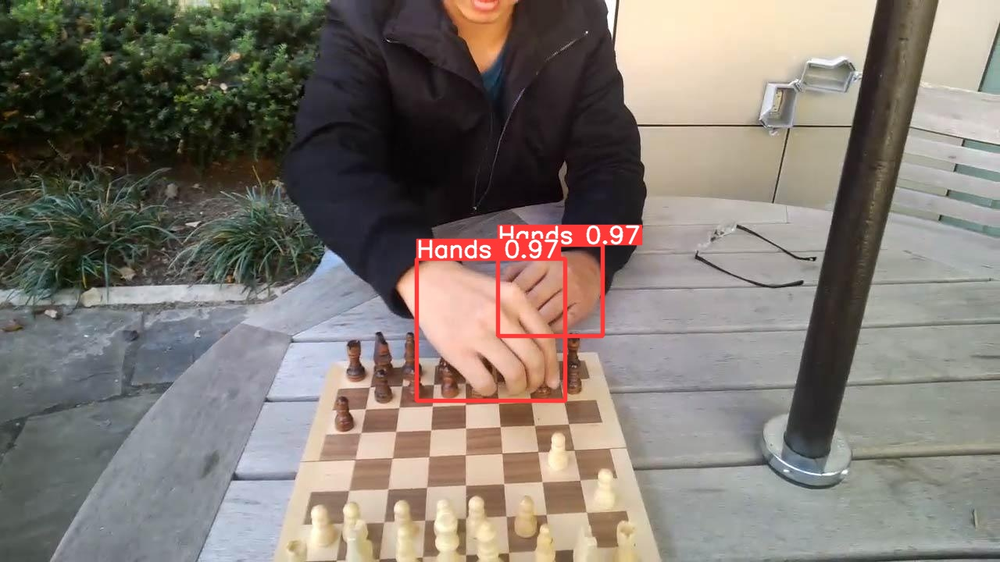

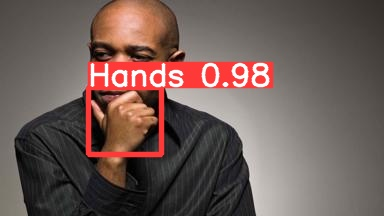

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>